In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import altair as alt

from path_explain.path_explainer_tf import PathExplainerTF
from path_explain import utils
from plot.scatter import scatter_plot
from plot.summary import summary_plot
import shap
import sklearn.model_selection

In [3]:
utils.set_up_environment(visible_devices='0')

In [4]:
x = pd.read_csv('X.csv')
y = np.load('y.npy')
x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(x, y, test_size=0.2, random_state=12)
x_train_train, x_train_valid, y_train_train, y_train_valid = sklearn.model_selection.train_test_split(x_train, y_train, test_size=0.2, random_state=27)

In [5]:
y_train = tf.keras.utils.to_categorical((y_train > 0).astype(int))
y_test = tf.keras.utils.to_categorical((y_test > 0).astype(int))
y_train_train = tf.keras.utils.to_categorical((y_train_train > 0).astype(int))
y_train_valid = tf.keras.utils.to_categorical((y_train_valid > 0).astype(int))

In [6]:
mu = x_train.mean()
sigma = x_train.var()**0.5

for df in [x, x_train, x_train_train, x_train_valid, x_test]:
    df -= mu
    for col in sigma.index:
        if sigma[col] != 0:
            df[col] /= sigma[col]
    df.fillna(0, inplace=True)

/homes/gws/psturm/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/homes/gws/psturm/miniconda3/lib/python3.7/site-packages/pandas/core/frame.py:4259: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  **kwargs


In [7]:
model = tf.keras.models.load_model('model.h5')

In [8]:
model_without_softmax = tf.keras.Model(inputs=model.input,
                              outputs=model.layers[-2].output)

In [9]:
explainer = PathExplainerTF(model_without_softmax)

In [10]:
def get_split(data):
    pred_logits = model.predict(data)
    pred_labels = np.argmax(pred_logits, axis=1)

    predicted_positive_mask = pred_labels == 1
    predicted_positive_data = data[predicted_positive_mask]
    predicted_positive_labels = pred_labels[predicted_positive_mask]

    predicted_negative_mask = pred_labels == 0
    predicted_negative_data = data[predicted_negative_mask]
    predicted_negative_labels = pred_labels[predicted_negative_mask]

    return predicted_positive_data, predicted_negative_data

In [11]:
x_test_pos, x_test_neg = get_split(x_test)
x_train_pos, x_train_neg = get_split(x_train)

In [12]:
pos_attr = explainer.attributions(x_test_pos.values,
                                           x_train_neg.values,
                                           batch_size=100,
                                           num_samples=100,
                                           use_expectation=True,
                                           output_indices=1,
                                           verbose=True)

100%|██████████| 1147/1147 [00:14<00:00, 77.47it/s]


In [19]:
neg_attr = explainer.attributions(x_test_neg.values,
                                           x_train_pos.values,
                                           batch_size=100,
                                           num_samples=100,
                                           use_expectation=True,
                                           output_indices=1,
                                           verbose=True)

100%|██████████| 1735/1735 [00:20<00:00, 83.23it/s]


In [16]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

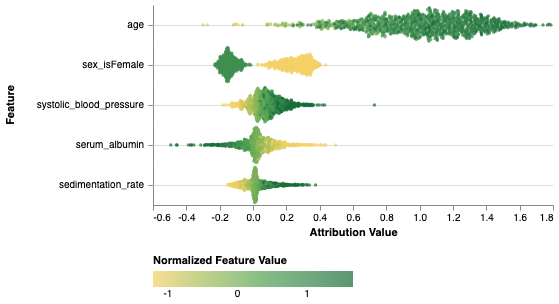

In [17]:
summary_plot(pos_attr,
             x_test_pos.values,
             feature_names=list(x_test_pos.columns),
             plot_top_k=5,
             standardize_features=False)

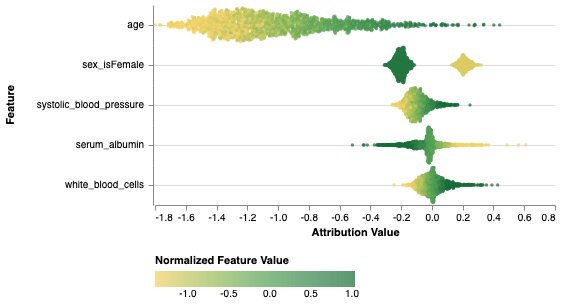

In [20]:
summary_plot(neg_attr,
             x_test_neg.values,
             feature_names=list(x_test_neg.columns),
             plot_top_k=5,
             standardize_features=False)

In [145]:
AGE, SEX, BP, ALBUMIN, SEDIMENT = np.argsort(np.mean(np.abs(test_attributions), axis=0))[::-1][:5].tolist()

In [42]:
age_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=100,
                                           num_samples=500,
                                           use_expectation=True,
                                           output_indices=np.argmax(pred_logits, axis=1),
                                           verbose=True,
                                           interaction_index=AGE)

100%|██████████| 2882/2882 [04:29<00:00, 10.70it/s]


In [43]:
sex_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=100,
                                           num_samples=500,
                                           use_expectation=True,
                                           output_indices=np.argmax(pred_logits, axis=1),
                                           verbose=True,
                                           interaction_index=SEX)

100%|██████████| 2882/2882 [04:32<00:00, 10.57it/s]


In [44]:
bp_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=100,
                                           num_samples=500,
                                           use_expectation=True,
                                           output_indices=np.argmax(pred_logits, axis=1),
                                           verbose=True,
                                           interaction_index=BP)

100%|██████████| 2882/2882 [04:32<00:00, 10.56it/s]


In [112]:
serum_albumin_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=100,
                                           num_samples=500,
                                           use_expectation=True,
                                           output_indices=np.argmax(pred_logits, axis=1),
                                           verbose=True,
                                           interaction_index=ALBUMIN)

100%|██████████| 2882/2882 [04:56<00:00,  9.70it/s]


In [113]:
sedimentation_interactions = explainer.interactions(x_test.values,
                                           x_train.values,
                                           batch_size=100,
                                           num_samples=500,
                                           use_expectation=True,
                                           output_indices=np.argmax(pred_logits, axis=1),
                                           verbose=True,
                                           interaction_index=SEDIMENT)

100%|██████████| 2882/2882 [04:56<00:00,  9.71it/s]


In [ ]:
np.save('test_attributions.npy', test_attributions)
np.save('age_interactions.npy', age_interactions)
np.save('sex_interactions.npy', sex_interactions)
np.save('bp_interactions.npy', bp_interactions)
np.save('serum_albumin_interactions.npy', serum_albumin_interactions)
np.save('sedimentation_interactions.npy', sedimentation_interactions)

In [130]:
data = pd.DataFrame({
    'Age Attributions': test_attributions[:, AGE],
    'Age Values': x_test['age'],
    'Label': np.argmax(y_test, axis=1),
    'Sum': np.sum(test_attributions, axis=-1)
})

## Displaying the trend of Attributions
The attributions are stratified by something I'm calling "confidence" - that is, the sum of attributions, which indicates difference from reference.

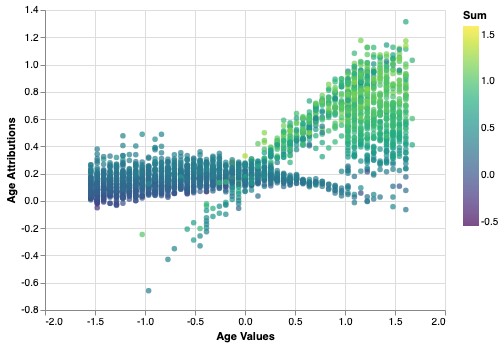

In [170]:
alt.Chart(data).mark_point(filled=True).encode(
    alt.X('Age Values:Q'),
    alt.Y('Age Attributions:Q'),
    alt.Color('Sum:Q', scale=alt.Scale(scheme='viridis'))
)

In [99]:
indices_confident = np.sum(test_attributions, axis=1) > 0.5
indices_unsure = np.sum(test_attributions, axis=1) <= 0.4

## Confident Attributions
Okay so for some reason, some of the attributions are more confident than others (strongly positive sum of attributions indicates strongly positive difference from reference). I don't know exactly why this is - you would think using the training data would mostly give strongly positive attributions. Here, I first display the "confident" attributions.

### Attributions to the Age feature
This first plot displays interactions between age and sex.

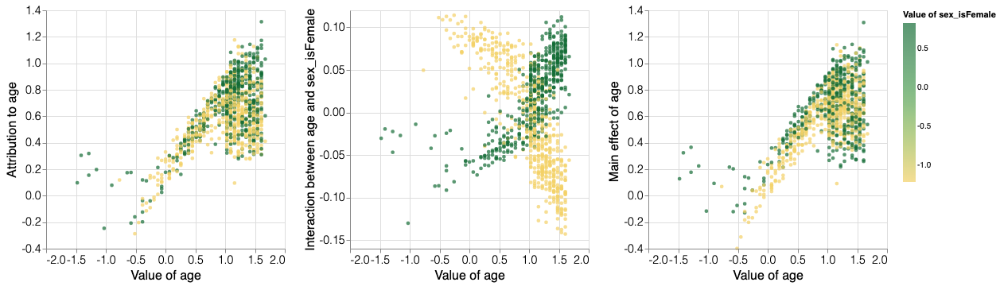

In [146]:
scatter_plot(test_attributions[indices_confident],
             x_test[indices_confident].values,
             feature_index=AGE,
             interactions=age_interactions[indices_confident],
             color_by=SEX,
             feature_names=x_test.columns)

## Attributions to Systolic Blood Pressure
This next plot displays interactions between age and blood pressure.

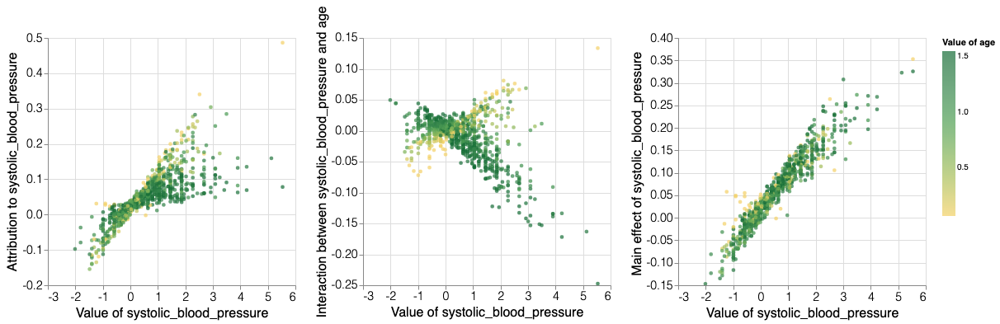

In [151]:
scatter_plot(test_attributions[indices_confident],
             x_test[indices_confident].values,
             feature_index=BP,
             interactions=bp_interactions[indices_confident],
             color_by=AGE,
             feature_names=x_test.columns)

There is also a clear interaction between blood pressure and sex:

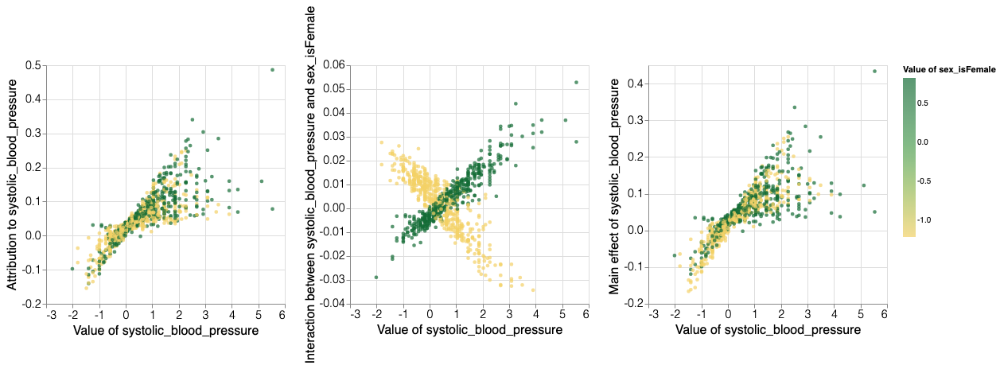

In [152]:
scatter_plot(test_attributions[indices_confident],
             x_test[indices_confident].values,
             feature_index=BP,
             interactions=bp_interactions[indices_confident],
             color_by=SEX,
             feature_names=x_test.columns)

### Attributions to Serum Albumin
We can look at interactions with serum albumin and age and blood pressure, respectively:

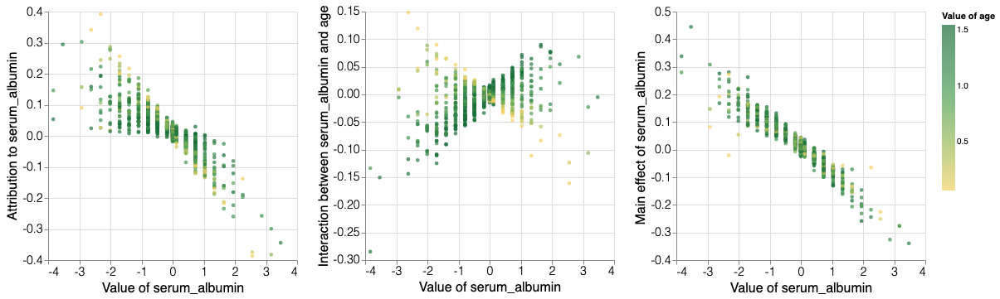

In [155]:
scatter_plot(test_attributions[indices_confident],
             x_test[indices_confident].values,
             feature_index=ALBUMIN,
             interactions=serum_albumin_interactions[indices_confident],
             color_by=AGE,
             feature_names=x_test.columns)

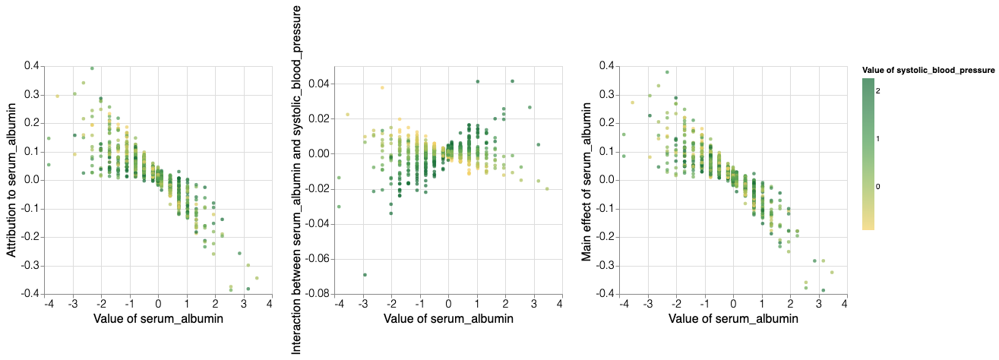

In [158]:
scatter_plot(test_attributions[indices_confident],
             x_test[indices_confident].values,
             feature_index=ALBUMIN,
             interactions=serum_albumin_interactions[indices_confident],
             color_by=BP,
             feature_names=x_test.columns)

### Attributions to Sedimentation Rate
Finally, lets look at the feature sedimentation rate and how it interacts with age:

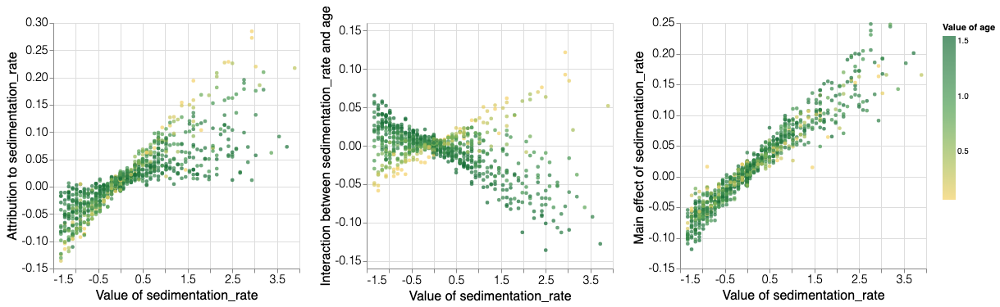

In [159]:
scatter_plot(test_attributions[indices_confident],
             x_test[indices_confident].values,
             feature_index=SEDIMENT,
             interactions=sedimentation_interactions[indices_confident],
             color_by=AGE,
             feature_names=x_test.columns)

## Unsure Attributions
Okay here I plot the attributions whose sum is "relatively" small. I have no metric for evaluating this, it's just from guessing at the numbers. These plots look really weird compared to the ones above.

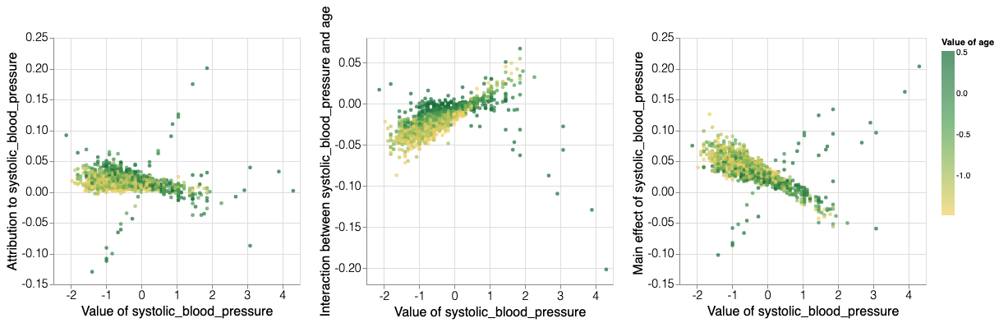

In [166]:
scatter_plot(test_attributions[indices_unsure],
             x_test[indices_unsure].values,
             feature_index=BP,
             interactions=bp_interactions[indices_unsure],
             color_by=AGE,
             feature_names=x_test.columns)

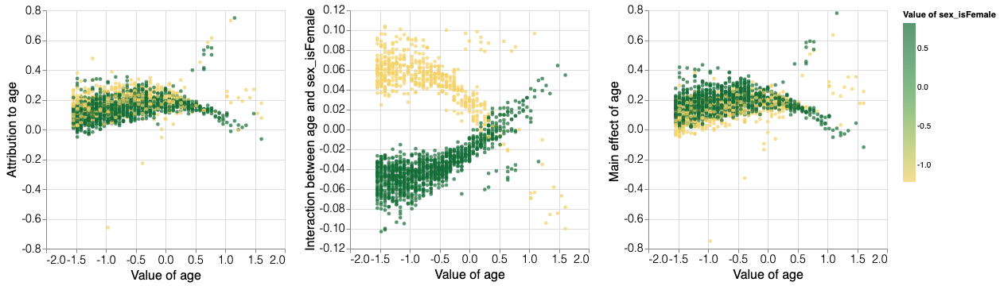

In [167]:
scatter_plot(test_attributions[indices_unsure],
             x_test[indices_unsure].values,
             feature_index=AGE,
             interactions=age_interactions[indices_unsure],
             color_by=SEX,
             feature_names=x_test.columns)

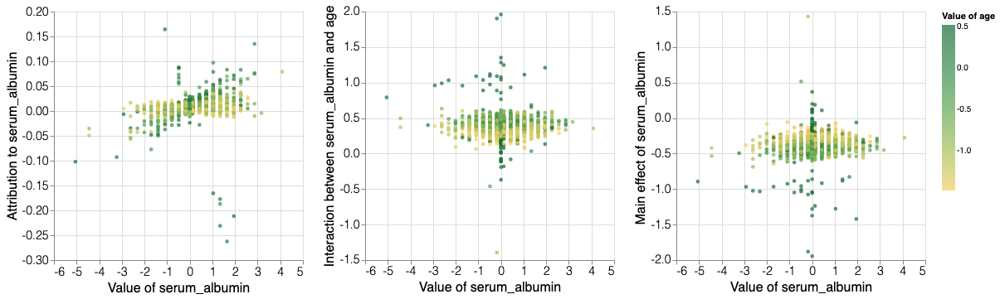

In [168]:
scatter_plot(test_attributions[indices_unsure],
             x_test[indices_unsure].values,
             feature_index=ALBUMIN,
             interactions=age_interactions[indices_unsure],
             color_by=AGE,
             feature_names=x_test.columns)